In [3]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [110]:
from matplotlib import rcParams, pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from warnings import simplefilter
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest, chi2

In [5]:
rcParams['figure.figsize'] = (16,8)
plt.style.use('fivethirtyeight')
simplefilter('ignore')

In [6]:
#data dir이 상위 폴더에 있음

data_dir = Path('../input/')
trn_file = data_dir/'train.csv'
test_file = data_dir/'test.csv'
seed = 42

In [7]:
df_train = pd.read_csv(trn_file, index_col=0)
df_test = pd.read_csv(test_file, index_col=0)

# 탐색적 데이터 분석(Exploratory Data Analysis)

In [8]:
df_train.info() # 거의 다 실수형이므로 실수형들은 자동으로 continuous라고 보고 
# nObserve, nDetect, class만 연속형인지 이산형인지 고려해보아야 할 듯 하다.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 320000 entries, 0 to 319999
Data columns (total 19 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   u          320000 non-null  float64
 1   g          320000 non-null  float64
 2   r          320000 non-null  float64
 3   i          320000 non-null  float64
 4   z          320000 non-null  float64
 5   redshift   320000 non-null  float64
 6   dered_u    320000 non-null  float64
 7   dered_g    320000 non-null  float64
 8   dered_r    320000 non-null  float64
 9   dered_i    320000 non-null  float64
 10  dered_z    320000 non-null  float64
 11  nObserve   320000 non-null  int64  
 12  nDetect    320000 non-null  int64  
 13  airmass_u  320000 non-null  float64
 14  airmass_g  320000 non-null  float64
 15  airmass_r  320000 non-null  float64
 16  airmass_i  320000 non-null  float64
 17  airmass_z  320000 non-null  float64
 18  class      320000 non-null  int64  
dtypes: float64(16), int64(3

In [9]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80000 entries, 320000 to 399999
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   u          80000 non-null  float64
 1   g          80000 non-null  float64
 2   r          80000 non-null  float64
 3   i          80000 non-null  float64
 4   z          80000 non-null  float64
 5   redshift   80000 non-null  float64
 6   dered_u    80000 non-null  float64
 7   dered_g    80000 non-null  float64
 8   dered_r    80000 non-null  float64
 9   dered_i    80000 non-null  float64
 10  dered_z    80000 non-null  float64
 11  nObserve   80000 non-null  int64  
 12  nDetect    80000 non-null  int64  
 13  airmass_u  80000 non-null  float64
 14  airmass_g  80000 non-null  float64
 15  airmass_r  80000 non-null  float64
 16  airmass_i  80000 non-null  float64
 17  airmass_z  80000 non-null  float64
dtypes: float64(16), int64(2)
memory usage: 11.6 MB


위의 결과에서 train test 모두 결측값이 없음을 확인함 
물론 test에 class가 안보이긴 한다. 나중에 예측값을 pandas로 붙여 줘야할 듯 하다.

In [10]:
df_train.describe()

,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
count,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000,320000.000000
mean,19.852429,18.376837,17.735761,17.174226,16.875187,0.058308,19.628874,18.227087,17.615434,17.152347,16.869277,6.332700,6.138816,1.175763,1.176528,1.175131,1.175430,1.176128,1.116322
std,1.945548,31.110759,1.466242,52.561464,57.146264,0.575457,1.923586,17.786568,1.473020,25.075760,35.436549,8.881129,8.551634,0.116297,0.118065,0.114723,0.115485,0.117156,0.923455
min,-17.687512,-17555.365606,7.731354,-23955.817764,-23955.817764,-166.048260,-42.837530,-9999.000000,-16.380230,-9999.000000,-9999.000000,1.000000,1.000000,1.000059,1.000012,1.000157,1.000105,1.000027,0.000000
25%,18.724150,17.474851,16.877190,16.523876,16.288890,0.000036,18.563598,17.348370,16.787138,16.453048,16.234063,1.000000,1.000000,1.088220,1.088448,1.087763,1.088021,1.088299,0.000000
50%,19.419439,18.140528,17.525850,17.149736,16.917610,0.047129,19.264635,18.022410,17.443415,17.087370,16.869390,2.000000,2.000000,1.179350,1.179235,1.179375,1.179377,1.179303,1.000000
75%,20.432092,19.073172,18.428089,18.007435,17.728924,0.094597,20.197603,18.888443,18.291078,17.906960,17.655653,5.000000,5.000000,1.227540,1.225990,1.229236,1.228599,1.226757,2.000000
max,58.623328,46.338272,72.009662,50.164052,52.612664,62.323343,30.777850,30.613170,31.957200,32.016220,30.781270,44.000000,42.000000,2.050775,2.080287,2.022134,2.036329,2.065390,2.000000


In [11]:
df_test.describe()

,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000
mean,19.859840,18.437104,17.739743,17.306491,17.148951,0.060083,19.634952,18.263779,17.619340,17.217804,16.870231,6.349950,6.15775,1.175956,1.176733,1.175311,1.175616,1.176326
std,1.954254,1.702973,1.478590,1.320742,24.643062,0.346845,1.921030,1.665741,1.476002,1.332361,35.436707,8.872794,8.55086,0.116424,0.118197,0.114845,0.115609,0.117285
min,-0.338524,-51.175280,-5.438650,5.326743,-39.527151,-30.148965,-30.633700,-18.655990,-8.756023,-3.697258,-9999.000000,1.000000,1.00000,1.000143,1.000086,1.000177,1.000150,1.000148
25%,18.727258,17.477982,16.881969,16.525463,16.288210,0.000034,18.570860,17.352245,16.790630,16.456230,16.230968,1.000000,1.00000,1.088091,1.088294,1.087693,1.087911,1.088175
50%,19.426062,18.145087,17.529944,17.155994,16.921198,0.047115,19.267415,18.024665,17.448660,17.091210,16.873305,2.000000,2.00000,1.179353,1.179252,1.179373,1.179390,1.179326
75%,20.434422,19.079345,18.434472,18.007966,17.733311,0.094769,20.199885,18.894768,18.295210,17.910950,17.657802,5.000000,5.00000,1.227833,1.226165,1.229388,1.228922,1.226935
max,56.847135,94.359125,46.691343,33.025919,6976.392220,46.390495,30.889910,30.952920,31.653620,30.947770,28.644080,44.000000,42.00000,2.050215,2.079697,2.021604,2.035784,2.064815


In [47]:
target_col = 'class'
feature_col = [x for x in df_train.columns if df_train[x].dtype in [np.int64, np.float64] and x !=target_col]
print(feature_col)
pred_col='pred'

['u', 'g', 'r', 'i', 'z', 'redshift', 'dered_u', 'dered_g', 'dered_r', 'dered_i', 'dered_z', 'nObserve', 'nDetect', 'airmass_u', 'airmass_g', 'airmass_r', 'airmass_i', 'airmass_z']


<AxesSubplot:>

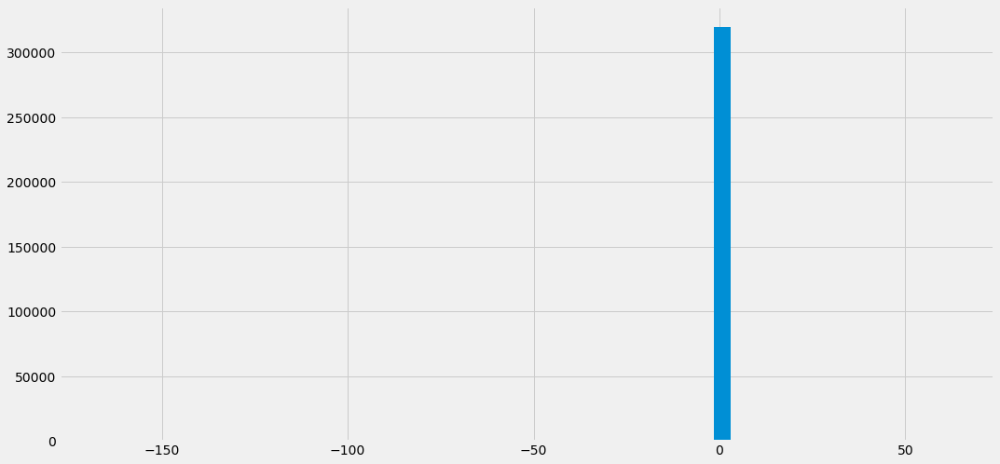

In [13]:
# sns.pairplot(data=df_train, vars=feature_col+[target_col] , size=5)
df_train.redshift.hist(bins=50)

In [14]:
trn_sample = df_train.sample(n=20000, random_state=seed)

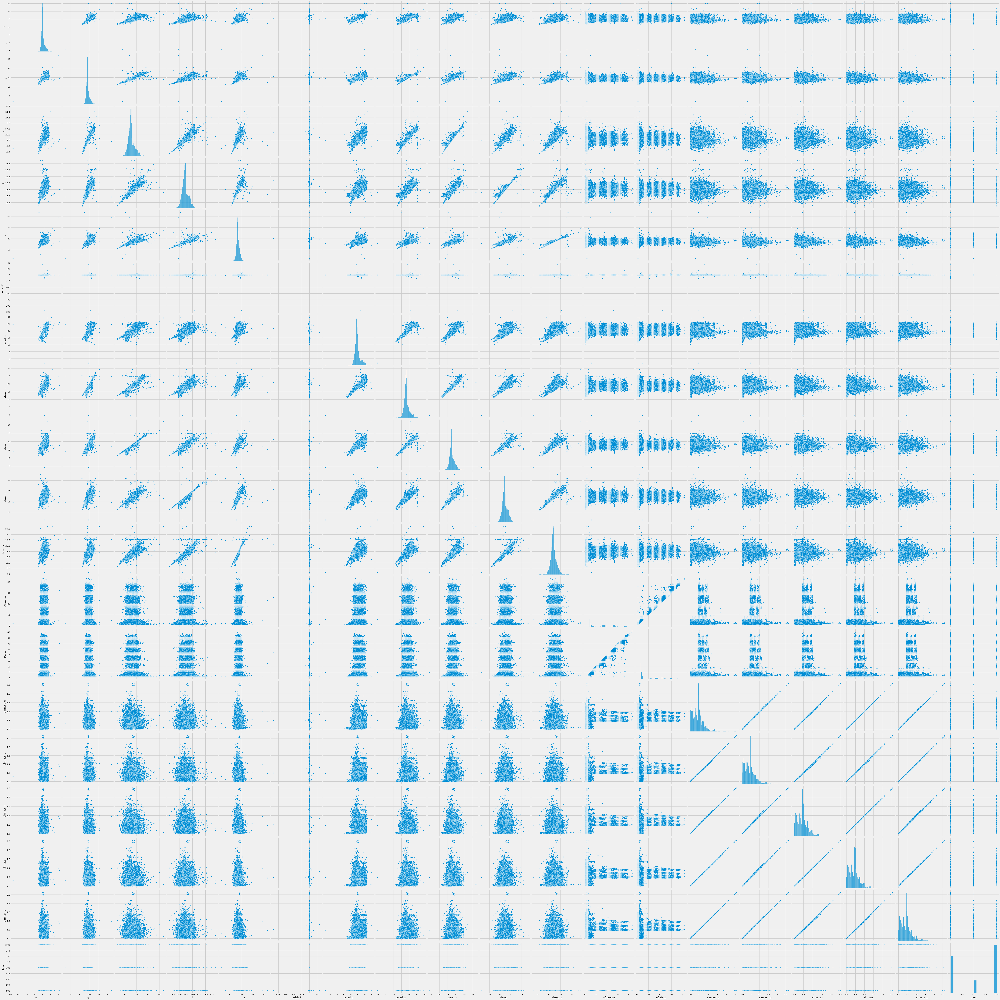

In [15]:
sns.pairplot(data=trn_sample, size=5)

In [16]:
df_train.corr().style.background_gradient()

,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
u,1.000000,0.048621,0.818125,0.017466,0.014199,-0.009243,0.935217,0.081037,0.782799,0.034951,0.021438,0.227273,0.221087,0.076302,0.076066,0.076441,0.076385,0.076197,-0.379313
g,0.048621,1.000000,0.049739,0.591288,0.543726,-0.000360,0.046967,0.998955,0.048157,0.707392,0.500364,0.011722,0.011415,0.001999,0.001934,0.002064,0.002032,0.001967,-0.019501
r,0.818125,0.049739,1.000000,0.022797,0.019127,-0.006304,0.805675,0.085505,0.969504,0.047424,0.030600,0.205900,0.195569,0.076337,0.075987,0.076592,0.076478,0.076175,-0.374905
i,0.017466,0.591288,0.022797,1.000000,0.919717,-0.000152,0.017510,0.590351,0.022486,0.987939,0.699012,0.005619,0.005580,-0.000755,-0.000829,-0.000679,-0.000718,-0.000792,-0.010138
z,0.014199,0.543726,0.019127,0.919717,1.000000,-0.000164,0.014029,0.542776,0.018913,0.908595,0.918965,0.005214,0.005192,-0.001465,-0.001521,-0.001406,-0.001436,-0.001493,-0.009960
redshift,-0.009243,-0.000360,-0.006304,-0.000152,-0.000164,1.000000,-0.007582,-0.000194,-0.002980,-0.000109,-0.000199,-0.007774,-0.007607,0.001382,0.001393,0.001370,0.001376,0.001387,0.073773
dered_u,0.935217,0.046967,0.805675,0.017510,0.014029,-0.007582,1.000000,0.086856,0.840528,0.037958,0.023229,0.222395,0.216898,0.088256,0.087821,0.088580,0.088433,0.088053,-0.337930
dered_g,0.081037,0.998955,0.085505,0.590351,0.542776,-0.000194,0.086856,1.000000,0.088660,0.707221,0.500081,0.019654,0.019033,0.005871,0.005777,0.005959,0.005916,0.005825,-0.030445
dered_r,0.782799,0.048157,0.969504,0.022486,0.018913,-0.002980,0.840528,0.088660,1.000000,0.049042,0.031533,0.199952,0.189958,0.083917,0.083433,0.084297,0.084121,0.083689,-0.341305
dered_i,0.034951,0.707392,0.047424,0.987939,0.908595,-0.000109,0.037958,0.707221,0.049042,1.000000,0.707473,0.011156,0.010817,0.001782,0.001696,0.001867,0.001825,0.001739,-0.018306


array([[<AxesSubplot:title={'center':'u'}>,
        <AxesSubplot:title={'center':'g'}>,
        <AxesSubplot:title={'center':'r'}>,
        <AxesSubplot:title={'center':'i'}>],
       [<AxesSubplot:title={'center':'z'}>,
        <AxesSubplot:title={'center':'redshift'}>,
        <AxesSubplot:title={'center':'dered_u'}>,
        <AxesSubplot:title={'center':'dered_g'}>],
       [<AxesSubplot:title={'center':'dered_r'}>,
        <AxesSubplot:title={'center':'dered_i'}>,
        <AxesSubplot:title={'center':'dered_z'}>,
        <AxesSubplot:title={'center':'nObserve'}>],
       [<AxesSubplot:title={'center':'nDetect'}>,
        <AxesSubplot:title={'center':'airmass_u'}>,
        <AxesSubplot:title={'center':'airmass_g'}>,
        <AxesSubplot:title={'center':'airmass_r'}>],
       [<AxesSubplot:title={'center':'airmass_i'}>,
        <AxesSubplot:title={'center':'airmass_z'}>,
        <AxesSubplot:title={'center':'class'}>, <AxesSubplot:>]],
      dtype=object)

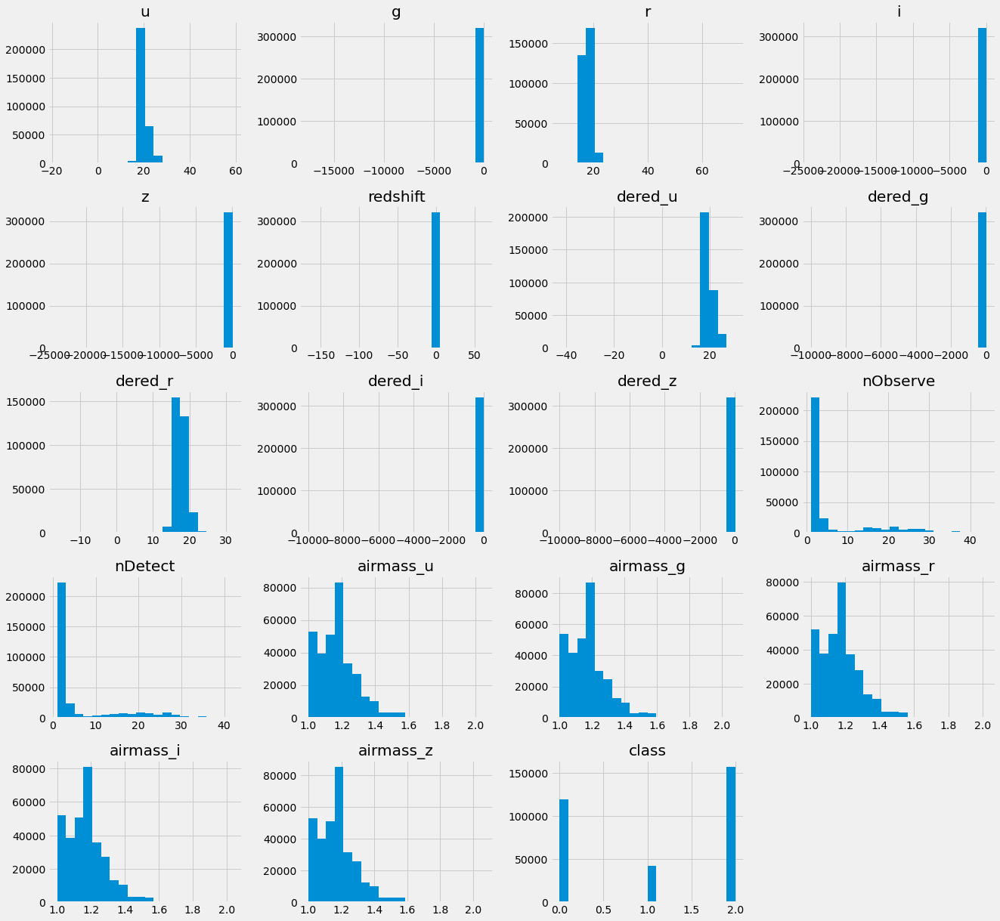

In [22]:
df_train.hist(bins=20, figsize=(20,20))# 분포 대부분이 한쪽에 쏠려서 멱함수 형태, 롱테일의 형태를 띄고 있다.


array([[<AxesSubplot:title={'center':'u'}>,
        <AxesSubplot:title={'center':'g'}>,
        <AxesSubplot:title={'center':'r'}>,
        <AxesSubplot:title={'center':'i'}>],
       [<AxesSubplot:title={'center':'z'}>,
        <AxesSubplot:title={'center':'redshift'}>,
        <AxesSubplot:title={'center':'dered_u'}>,
        <AxesSubplot:title={'center':'dered_g'}>],
       [<AxesSubplot:title={'center':'dered_r'}>,
        <AxesSubplot:title={'center':'dered_i'}>,
        <AxesSubplot:title={'center':'dered_z'}>,
        <AxesSubplot:title={'center':'nObserve'}>],
       [<AxesSubplot:title={'center':'nDetect'}>,
        <AxesSubplot:title={'center':'airmass_u'}>,
        <AxesSubplot:title={'center':'airmass_g'}>,
        <AxesSubplot:title={'center':'airmass_r'}>],
       [<AxesSubplot:title={'center':'airmass_i'}>,
        <AxesSubplot:title={'center':'airmass_z'}>,
        <AxesSubplot:title={'center':'class'}>, <AxesSubplot:>]],
      dtype=object)

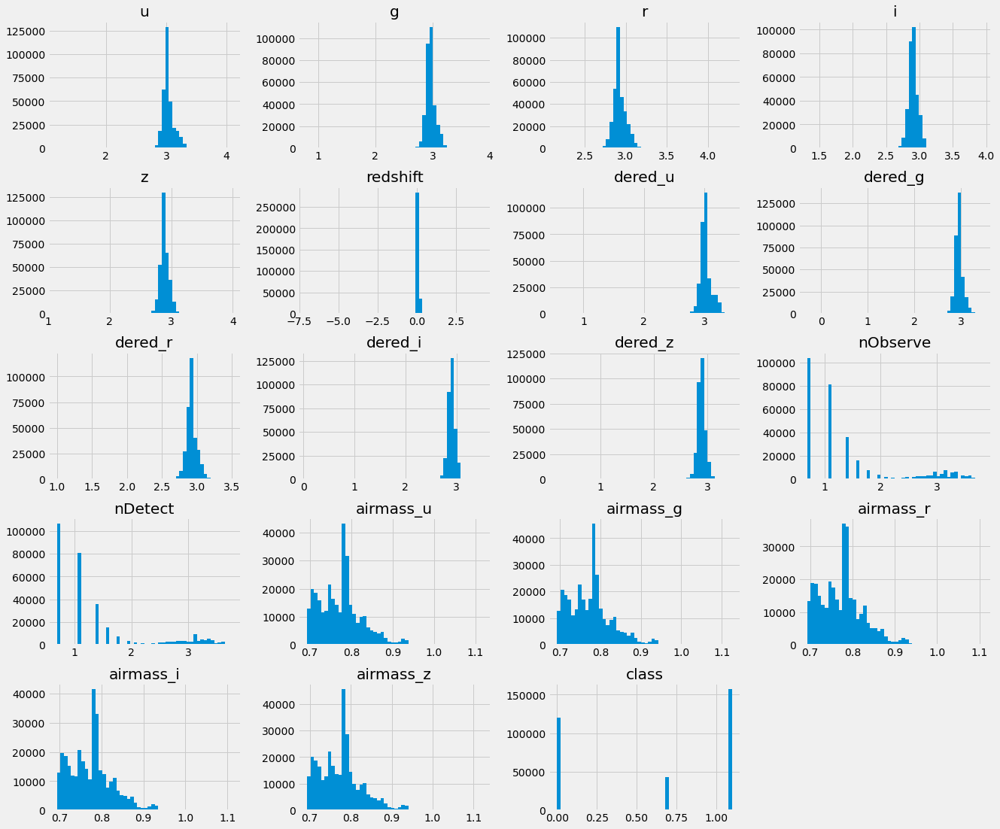

In [23]:
df_train.apply(np.log1p).hist(bins=50, figsize=(20, 18))

In [24]:
# log 씌우고 한번 더 
df_train_log = df_train.apply(np.log1p)


array([[<AxesSubplot:title={'center':'u'}>,
        <AxesSubplot:title={'center':'g'}>,
        <AxesSubplot:title={'center':'r'}>,
        <AxesSubplot:title={'center':'i'}>],
       [<AxesSubplot:title={'center':'z'}>,
        <AxesSubplot:title={'center':'redshift'}>,
        <AxesSubplot:title={'center':'dered_u'}>,
        <AxesSubplot:title={'center':'dered_g'}>],
       [<AxesSubplot:title={'center':'dered_r'}>,
        <AxesSubplot:title={'center':'dered_i'}>,
        <AxesSubplot:title={'center':'dered_z'}>,
        <AxesSubplot:title={'center':'nObserve'}>],
       [<AxesSubplot:title={'center':'nDetect'}>,
        <AxesSubplot:title={'center':'airmass_u'}>,
        <AxesSubplot:title={'center':'airmass_g'}>,
        <AxesSubplot:title={'center':'airmass_r'}>],
       [<AxesSubplot:title={'center':'airmass_i'}>,
        <AxesSubplot:title={'center':'airmass_z'}>,
        <AxesSubplot:title={'center':'class'}>, <AxesSubplot:>]],
      dtype=object)

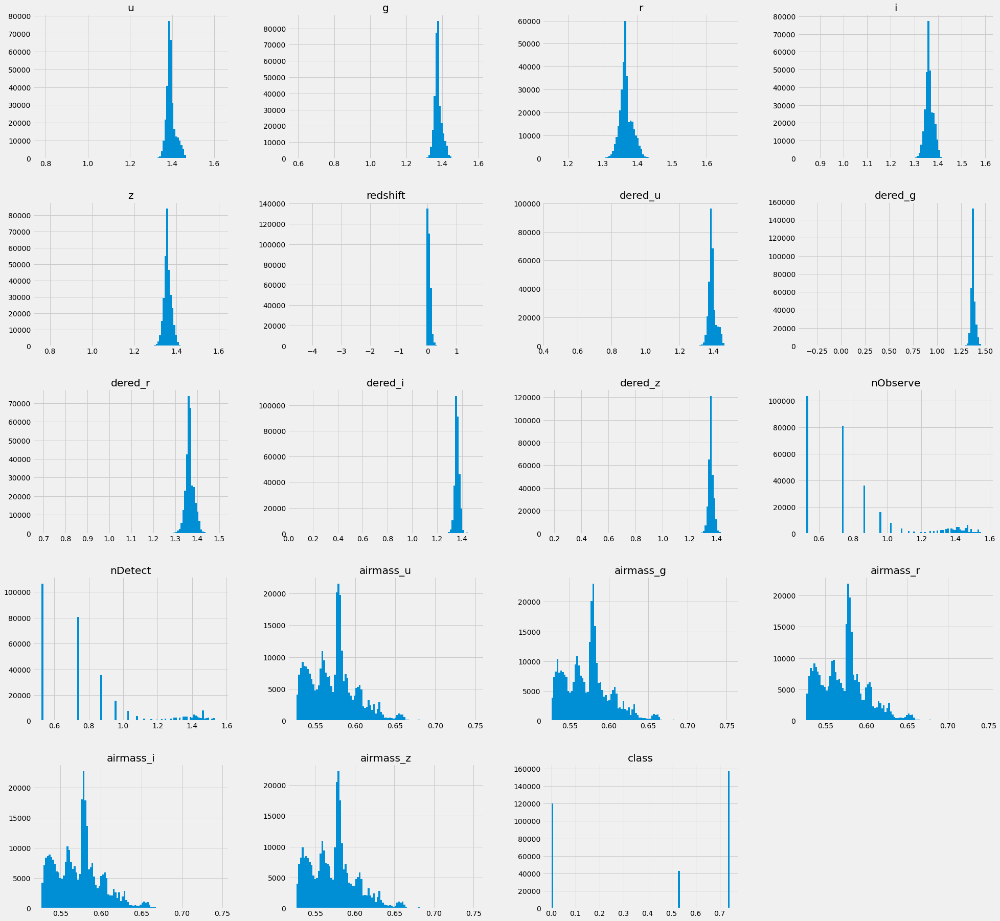

In [25]:
df_train_log.apply(np.log1p).hist(bins=100, figsize=(30,30)) # 2번이나 log를 씌워도 한번 log한거랑 비슷한듯하다.

## RMSE/RMSLE 함수 정의 (lambda 함수)

In [45]:
rmse = lambda y, p: np.sqrt(mean_squared_error(y, p))#y,p의 차이의 평균을 구하고 루트를 씌움
rmsle = lambda y, p: np.sqrt(mean_squared_error(np.log1p(y), np.log1p(p)))

In [32]:
lr = LinearRegression()# 선형 회귀 모델 객체

In [35]:
lr.fit(df_train[feature_col],df_train[target_col])#학습

LinearRegression()

In [54]:
df_train['pred'] = lr.predict(df_train[feature_col])
print(f' RMSE:\t{rmse(df_train[target_col], df_train[pred_col]):12.2f}')
# print(f' RMSLE:\t{rmsle(df_train[target_col], df_train[pred_col]):12.2f}')

 RMSE:	        0.83


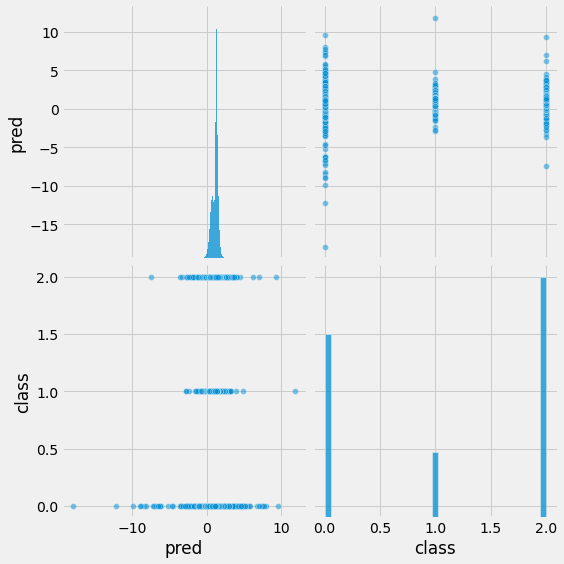

In [56]:
sns.pairplot(data=df_train, vars=[pred_col, target_col], size=4, plot_kws={'alpha': .5})

Text(0, 0.5, 'pred')

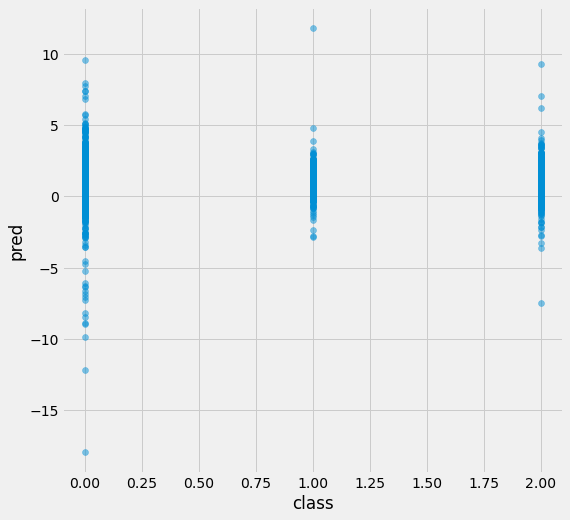

In [58]:
plt.figure(figsize=(8,8))
plt.scatter(df_train[target_col],df_train[pred_col],alpha=.5)
plt.xlabel('class')
plt.ylabel('pred')


In [61]:
df_train[pred_col].describe()

count    320000.000000
mean          1.116322
std           0.414879
min         -17.933333
25%           0.854699
50%           1.226192
75%           1.373913
max          11.814498
Name: pred, dtype: float64

## 로지스틱 회귀 -분류 문제 

In [88]:
lg = LogisticRegression()
lg.fit(df_train[feature_col],df_train[target_col])#학습
df_train['pred'] = lg.predict(df_train[feature_col])
print(f' RMSE:\t{rmse(df_train[target_col], df_train[pred_col]):12.2f}')

 RMSE:	        0.96


## feature 선택

## chi2(카이제곱-양의 값이어야됨), f_classif(ANOVA F-value 기준으로 선택)

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

In [80]:
df_train[feature_col].describe()#기본 f_classif
f_sel1 = SelectKBest(k =10).fit_transform(df_train[feature_col],df_train[target_col])
print(f_sel1) # u g r i z redshift 선택


[[ 2.32639562e+01  1.90095003e+01 -8.10862718e-05 ...  1.18976400e+00
   1.19068100e+00  1.19020600e+00]
 [ 1.50521474e+01  1.34524179e+01  4.50606978e-03 ...  1.25325400e+00
   1.25783600e+00  1.25553300e+00]
 [ 1.67863848e+01  1.55363179e+01  4.71976913e-04 ...  1.02249900e+00
   1.02410500e+00  1.02329100e+00]
 ...
 [ 2.11889721e+01  1.72956101e+01 -1.01475166e-05 ...  1.19325900e+00
   1.19414000e+00  1.19368300e+00]
 [ 1.88471869e+01  1.65057289e+01 -4.52094887e-05 ...  1.17245800e+00
   1.17256100e+00  1.17249300e+00]
 [ 1.98604384e+01  1.85155795e+01 -9.65442665e-04 ...  1.05707600e+00
   1.05624000e+00  1.05665000e+00]]


In [84]:
lr = LinearRegression()# 선형 회귀 모델 객체
lr.fit(f_sel1,df_train[target_col])#학습
#df_train.drop(pred_col)
df_train[pred_col] = lr.predict(f_sel1)
print(f' RMSE:\t{rmse(df_train[target_col], df_train[pred_col]):12.2f}')

 RMSE:	        0.83


In [91]:
lg = LogisticRegression()
lg.fit(f_sel1,df_train[target_col])#학습
#df_train.drop(pred_col)
df_train['pred'] = lg.predict(f_sel1)
print(f' RMSE:\t{rmse(df_train[target_col], df_train[pred_col]):12.2f}')

print(f' RMSLE:\t{rmsle(df_train[target_col], df_train[pred_col]):12.2f}')

 RMSE:	        0.79
 RMSLE:	        0.43


0.96에서 0.79로 떨어졌다... feature 선택이 잘되었나보다

## Wrapper Method : 유용성을 측정한 방법
![image](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.semanticscholar.org%2Fpaper%2FA-Comparative-View-Of-Applying-Linear-And-To-Manzoor-Jaskani%2Ffeded03337999641fb248e2d54a4802185b463f7&psig=AOvVaw07pL1rKm4ZxftiJV3S77Th&ust=1600745535716000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCMiXjvqn-esCFQAAAAAdAAAAABAD)
recursive feature elimination(RFE)
- scikit-learn에 함수가 있습니다.
- SVM을 사용하여 재귀적으로 제거하는 방법입니다.
- 유사한 방법으로 Backward elimination, Forward elimination, Bidirectional elimination이 있습니다.

sequential feature selection(SFS)라는 방법도 있다.
- mlxtend에 함수가 있음
- 그리디 알고리즘으로 빈 subset에서 피처를 하나씩 추가하는 방법으로 이루어지고, 최후에 원하는 것만 남게됨

genetic algorithm
Univariate selection
Exhaustive
mRMR(Minimum Redundancy Maximum Relevance)
- feature 중복성 최소화


## Filter Method: 관련성을 찾는 방법 

set of all features -> selecting the best subset -> learning Algorithm -> performance

통계적 측정 방법을 사용하여 피처들의 상관관계를 알아내는 방식

상관계수가 반드시 보델에 적합한 피처라고 할 수 없지만 상관관계를 알아내는데 적합하므로 wrapper method를 사용하기 전에 전처리하는데 사용할 수 있다. 

- information gain
- chi-square test
- fisher score
- correlation coefficient
- - heatmap으로 주로 표현하여 시각화
- variance threshold


## Embedded Method: 유용성을 측정하지만 내장 metric을 사용하는 방법

set of all features -> (서브셋 생성 <-> 러닝 알고리즘+퍼포먼스)내부 과정 반복

모델의 정확도에 기여하는 피처를 학습함. 좀 더 적은 계수를 가지는 회귀식을 찾는 방향으로 제약조건을 주어 이를 제어한다.

- [LASSO](https://en.wikipedia.org/wiki/Lasso_(statistics)): L1-norm을 통해 제약을 주는 방법
- Ridge: L2-norm을 통해 제약을 주는 방법
- Elastic Net: 위 둘을 선형 결합한 방법
- SelectFromModel : decision tree 기반 알고리즘에서 피처를 뽑아오는 방법(RandomForest, LightGBM 등) - scikit-learn 함수

## RFE(Recursive Feature Elimination)

### [반복적으로 피쳐를 지워서 남겨진 피쳐를 사용](https://data-learning.tistory.com/18)

In [87]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [95]:
model = LogisticRegression(solver='liblinear')
rfe = RFE(model,10)
fit=rfe.fit(df_train[feature_col],df_train[target_col])
print(fit.n_features_, fit.support_, fit.ranking_)

sel_bool = fit.support_

10 [ True  True  True False False  True  True  True  True False False False
 False False  True  True False  True] [1 1 1 6 7 1 1 1 1 5 3 9 8 2 1 1 4 1]


In [108]:
#feature 선택해서 리스트로 만듬
f_sel2 = []

for i in range(len(feature_col)):
    if(sel_bool[i] == True):
        f_sel2.append(feature_col[i])
print(f_sel2)

['u', 'g', 'r', 'redshift', 'dered_u', 'dered_g', 'dered_r', 'airmass_g', 'airmass_r', 'airmass_z']


In [104]:
df_train_sel = df_train[f_sel2+['class']]
df_train_sel.corr().style.background_gradient()

,u,g,r,redshift,dered_u,dered_g,dered_r,airmass_g,airmass_r,airmass_z,class
u,1.000000,0.048621,0.818125,-0.009243,0.935217,0.081037,0.782799,0.076066,0.076441,0.076197,-0.379313
g,0.048621,1.000000,0.049739,-0.000360,0.046967,0.998955,0.048157,0.001934,0.002064,0.001967,-0.019501
r,0.818125,0.049739,1.000000,-0.006304,0.805675,0.085505,0.969504,0.075987,0.076592,0.076175,-0.374905
redshift,-0.009243,-0.000360,-0.006304,1.000000,-0.007582,-0.000194,-0.002980,0.001393,0.001370,0.001387,0.073773
dered_u,0.935217,0.046967,0.805675,-0.007582,1.000000,0.086856,0.840528,0.087821,0.088580,0.088053,-0.337930
dered_g,0.081037,0.998955,0.085505,-0.000194,0.086856,1.000000,0.088660,0.005777,0.005959,0.005825,-0.030445
dered_r,0.782799,0.048157,0.969504,-0.002980,0.840528,0.088660,1.000000,0.083433,0.084297,0.083689,-0.341305
airmass_g,0.076066,0.001934,0.075987,0.001393,0.087821,0.005777,0.083433,1.000000,0.997561,0.999853,-0.076640
airmass_r,0.076441,0.002064,0.076592,0.001370,0.088580,0.005959,0.084297,0.997561,1.000000,0.998610,-0.076472
airmass_z,0.076197,0.001967,0.076175,0.001387,0.088053,0.005825,0.083689,0.999853,0.998610,1.000000,-0.076640


In [112]:
lg = LogisticRegression()
lg.fit(df_train_sel[f_sel2],df_train_sel[target_col])#학습
df_train_sel['pred'] = lg.predict(df_train[f_sel2])
print(f' RMSE:\t{rmse(df_train_sel[target_col], df_train_sel[pred_col]):12.2f}')
print(f' RMSLE:\t{rmsle(df_train_sel[target_col], df_train_sel[pred_col]):12.2f}')
print(f' ACCURACY:\t{accuracy_score(df_train_sel[target_col], df_train_sel[pred_col])}')

 RMSE:	        0.78
 RMSLE:	        0.42
 ACCURACY:	0.742590625


더 줄었다. 

# Modeling(tree 기반 알고리즘)의 importance 속성 사용

In [113]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

In [114]:
select = SelectFromModel(RandomForestClassifier(n_estimators=50, random_state=42), threshold="median")
select.fit(df_train[feature_col],df_train[target_col])
X_train_list = select.transform(df_train[feature_col])
print(X_train_list)

[[23.2639562  19.0095003  17.67243934 ... 18.95512    17.63211
  16.90894   ]
 [15.05214741 13.45241792 13.26844956 ... 13.41139    13.23625
  13.13468   ]
 [16.78638476 15.53631793 15.39353509 ... 15.44004    15.32173
  15.29608   ]
 ...
 [21.1889721  17.29561007 16.90107199 ... 17.21518    16.8403
  16.63555   ]
 [18.84718687 16.50572886 16.1805709  ... 15.18229    15.19693
  15.17935   ]
 [19.86043839 18.5155795  18.41488417 ... 18.49081    18.39869
  18.30977   ]]


In [130]:
lg = LogisticRegression()
lg.fit(X_train_list,df_train_sel[target_col])#학습
df_train['pred'] = lg.predict(X_train_list)
print(f' RMSE:\t{rmse(df_train[target_col], df_train[pred_col]):12.2f}')
print(f' RMSLE:\t{rmsle(df_train[target_col], df_train[pred_col]):12.2f}')
print(f' ACCURACY:\t{accuracy_score(df_train[target_col], df_train[pred_col])}')

 RMSE:	        0.82
 RMSLE:	        0.44
 ACCURACY:	0.724690625


## redshift 속성 Bining

In [115]:
pd.qcut?

In [120]:
df_train_cp = df_train


In [122]:
df_train_cp['redshift_b'] = pd.qcut(df_train['redshift'], 10, labels=False) 

# sns.pairplot(data=df_train, size=4, plot_kws={'alpha': .5})

In [127]:
df_train_cp[['redshift_b', 'redshift']].describe()


,redshift_b,redshift
count,320000.000000,320000.000000
mean,4.500000,0.058308
std,2.872286,0.575457
min,0.000000,-166.048260
25%,2.000000,0.000036
50%,4.500000,0.047129
75%,7.000000,0.094597
max,9.000000,62.323343


In [131]:
# rfe 한번 더 해봄 bining 해보곤 난후

#model = LogisticRegression(solver='liblinear')
rfe = RFE(model,10)
fit=rfe.fit(df_train_cp[feature_col],df_train_cp[target_col])
print(fit.n_features_, fit.support_, fit.ranking_)

sel_bool = fit.support_

#feature 선택해서 리스트로 만듬
f_sel3 = []

for i in range(len(feature_col)):
    if(sel_bool[i] == True):
        f_sel3.append(feature_col[i])
print(f_sel3)
df_train_sel = df_train[f_sel3+['class']]

10 [ True  True  True False False  True  True  True  True False False False
 False False  True  True False  True] [1 1 1 6 7 1 1 1 1 5 3 9 8 2 1 1 4 1]
['u', 'g', 'r', 'redshift', 'dered_u', 'dered_g', 'dered_r', 'airmass_g', 'airmass_r', 'airmass_z']


In [132]:
lg = LogisticRegression()
lg.fit(df_train_cp[f_sel3],df_train_cp[target_col])#학습
df_train_cp['pred'] = lg.predict(df_train_cp[f_sel3])
print(f' RMSE:\t{rmse(df_train_cp[target_col], df_train_cp[pred_col]):12.2f}')
print(f' RMSLE:\t{rmsle(df_train_cp[target_col], df_train_cp[pred_col]):12.2f}')
print(f' ACCURACY:\t{accuracy_score(df_train_cp[target_col], df_train_cp[pred_col])}')

 RMSE:	        0.78
 RMSLE:	        0.42
 ACCURACY:	0.742590625
